<a href="https://colab.research.google.com/github/bincynadar/crop/blob/master/RCNNNfinalfinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
import keras
import json

In [ ]:
path = '/content/drive/MyDrive/rcnnn/agri_data/agri_data/'

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/rcnnn/agri_data/agri_label.csv')

In [ ]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,agri_0_9354.jpeg,512,512,weed,63,120,425,442
1,agri_0_9354.jpeg,512,512,weed,0,1,180,148
2,agri_0_7574.jpeg,512,512,crop,95,167,453,469
3,agri_0_8960.jpeg,512,512,weed,52,76,422,353
4,agri_0_417.jpeg,512,512,weed,7,75,511,411


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2072 entries, 0 to 2071
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  2072 non-null   object
 1   width     2072 non-null   int64 
 2   height    2072 non-null   int64 
 3   class     2072 non-null   object
 4   xmin      2072 non-null   int64 
 5   ymin      2072 non-null   int64 
 6   xmax      2072 non-null   int64 
 7   ymax      2072 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 129.6+ KB


In [ ]:
folder_images = os.listdir(path)

In [ ]:
len(folder_images)

1300

In [ ]:
train_images = folder_images[:1000]

In [ ]:
test_images = folder_images[1000:]

In [ ]:
j=0
for i in tqdm(list(df['filename'].unique())):
    if i in folder_images:
        j+=1
print(j)        



100%|██████████| 1300/1300 [00:00<00:00, 57245.09it/s]

1300




0it [00:00, ?it/s]

8it [00:00, 75.68it/s]

16it [00:00, 67.35it/s]


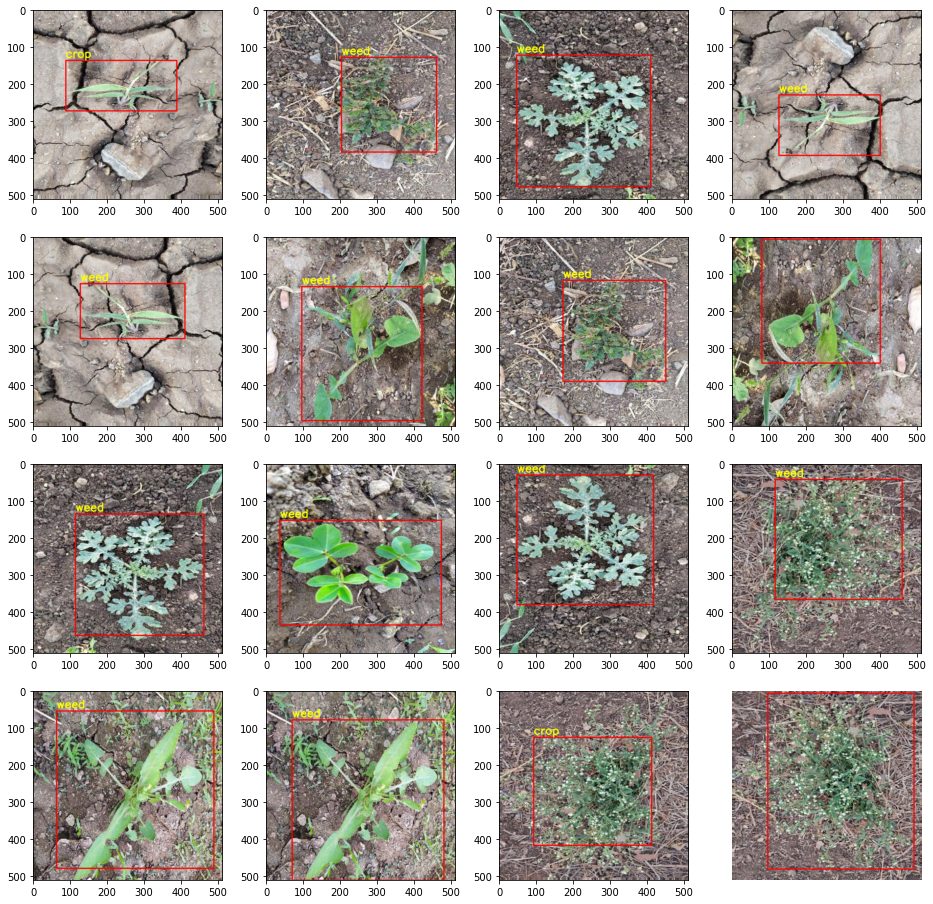

In [ ]:
_ , axes = plt.subplots(4,4,figsize=(16,16))
for i,ax in tqdm(zip(range(16),axes.flat)):
    temp_df = df[df['filename']==folder_images[i]].reset_index(drop=True)
    temp_img = cv2.imread(path+folder_images[i])
    temp_img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
    for j in range(len(temp_df)):
        rect = cv2.rectangle(temp_img,(temp_df.loc[j,'xmin'],temp_df.loc[j,'ymin']),(temp_df.loc[j,'xmax'],temp_df.loc[j,'ymax']),(255,0,0),2,cv2.LINE_AA)
        rect_text = cv2.putText(rect,temp_df.loc[j,'class'],(temp_df.loc[j,'xmin'],temp_df.loc[j,'ymin']-8), cv2.FONT_HERSHEY_SIMPLEX,1, (255,255,0), 2, cv2.LINE_AA)
    ax.imshow(rect_text)
    plt.axis('off')

In [ ]:
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

In [ ]:
img = cv2.imread(path+folder_images[45])
ss.setBaseImage(img)
ss.switchToSelectiveSearchFast()
rects = ss.process()

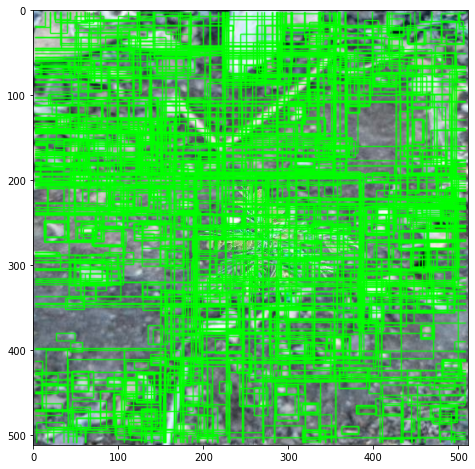

In [ ]:
sel_rects = rects[:1200]
imOut = img.copy()
for i, rect in (enumerate(sel_rects)):
    x, y, w, h = rect
    cv2.rectangle(imOut, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
plt.figure(figsize=(8,8))
plt.imshow(imOut)

In [ ]:
%cd '/content/drive/MyDrive/rcnnn'

/content/drive/MyDrive/rcnnn


In [ ]:
!python iou_calculation.py

In [ ]:
!python region_proposals.py

In [ ]:
from region_proposals import iou_filter

In [ ]:
ss,neg =iou_filter(path+folder_images[1280],df,thresh=0.5)

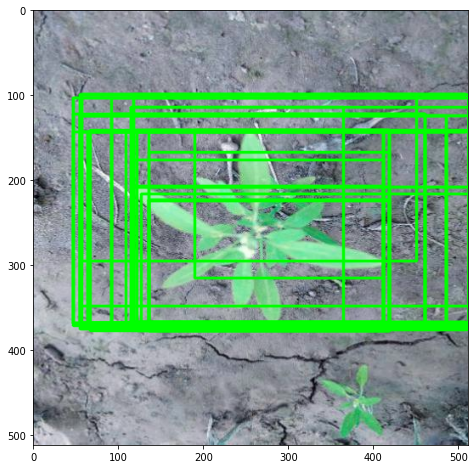

In [ ]:
img = cv2.imread(path+folder_images[1280])
for i, rect in (enumerate(ss)):
    x, y, w, h = rect[0]
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2, cv2.LINE_AA)
    
plt.figure(figsize=(12,8))
plt.imshow(img)

In [ ]:
len(ss)

44

In [ ]:
len(neg)

85

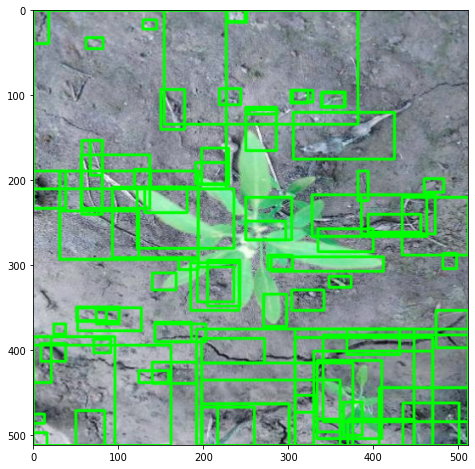

In [ ]:
img = cv2.imread(path+folder_images[1280])
for i, rect in (enumerate(neg)):
    x, y, w, h = rect
    
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2, cv2.LINE_AA)
    
    
plt.figure(figsize=(12,8))
plt.imshow(img)

In [ ]:
train_data = {}
test_data  = {}

In [ ]:
for i,img in tqdm(enumerate(train_images)):
    ss,neg =iou_filter(path + img , df , thresh=0.5)
    train_data[img] = {'region_proposal':ss,'negative_example':neg}



0it [00:00, ?it/s]

1it [00:03,  3.89s/it]

2it [00:08,  4.07s/it]

3it [00:13,  4.25s/it]

4it [00:17,  4.18s/it]

5it [00:20,  4.06s/it]

6it [00:24,  4.03s/it]

7it [00:29,  4.11s/it]

8it [00:33,  4.07s/it]

9it [00:37,  4.16s/it]

10it [00:41,  4.14s/it]

11it [00:45,  4.17s/it]

12it [00:50,  4.19s/it]

13it [00:54,  4.18s/it]

14it [00:58,  4.20s/it]

15it [01:03,  4.38s/it]

16it [01:07,  4.44s/it]

17it [01:12,  4.47s/it]

18it [01:17,  4.61s/it]

19it [01:21,  4.48s/it]

20it [01:25,  4.41s/it]

21it [01:29,  4.36s/it]

22it [01:33,  4.25s/it]

23it [01:37,  4.17s/it]

24it [01:42,  4.28s/it]

25it [01:46,  4.25s/it]

26it [01:51,  4.37s/it]

27it [01:55,  4.26s/it]

28it [01:59,  4.28s/it]

29it [02:03,  4.06s/it]

30it [02:07,  4.18s/it]

31it [02:12,  4.31s/it]

32it [02:16,  4.44s/it]

33it [02:20,  4.25s/it]

34it [02:24,  4.17s/it]

35it [02:28,  4.09s/it]

36it [02:33,  4.18s/it]

37it [02:37,  4.24s/it]

38it [02:41,  4.18s/it]

39it [02:45,  4.04s/it]

40it [02:48,

In [ ]:
for i,img in tqdm(enumerate(test_images)):
    ss,neg =iou_filter(path + img , df , thresh=0.5)
    test_data[img] = {'region_proposal':ss,'negative_example':neg}



0it [00:00, ?it/s]

1it [00:04,  4.07s/it]

2it [00:08,  4.15s/it]

3it [00:12,  4.23s/it]

4it [00:17,  4.29s/it]

5it [00:20,  4.12s/it]

6it [00:25,  4.16s/it]

7it [00:29,  4.09s/it]

8it [00:33,  4.16s/it]

9it [00:38,  4.34s/it]

10it [00:42,  4.21s/it]

11it [00:46,  4.33s/it]

12it [00:50,  4.25s/it]

13it [00:54,  4.19s/it]

14it [00:59,  4.28s/it]

15it [01:03,  4.31s/it]

16it [01:08,  4.38s/it]

17it [01:11,  4.14s/it]

18it [01:15,  3.93s/it]

19it [01:19,  3.87s/it]

20it [01:22,  3.82s/it]

21it [01:26,  3.76s/it]

22it [01:30,  3.96s/it]

23it [01:35,  4.06s/it]

24it [01:38,  4.00s/it]

25it [01:43,  4.23s/it]

26it [01:47,  4.10s/it]

27it [01:51,  4.06s/it]

28it [01:56,  4.30s/it]

29it [02:00,  4.28s/it]

30it [02:05,  4.35s/it]

31it [02:09,  4.36s/it]

32it [02:13,  4.39s/it]

33it [02:17,  4.27s/it]

34it [02:22,  4.34s/it]

35it [02:26,  4.38s/it]

36it [02:31,  4.33s/it]

37it [02:35,  4.25s/it]

38it [02:38,  4.04s/it]

39it [02:43,  4.15s/it]

40it [02:47,

In [ ]:
#converting numpy instantant into python datatype
import json
class MyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        else:
            return super(MyEncoder, self).default(obj)

In [ ]:
with open('train.json','w+') as output_file:
    json.dump(train_data,output_file,cls=MyEncoder)

In [ ]:
with open('test.json','w+') as output_file:
    json.dump(test_data,output_file,cls=MyEncoder)

In [ ]:
with open('train.json') as train:
    train_json = json.load(train)

In [ ]:
with open('test.json') as test:
    test_json = json.load(test)

In [ ]:
train_json == train_data

True

In [ ]:
test_json == test_data

True

In [ ]:
!ls

agri_data		 iou_calculation.py  region_proposals.py  train.json
crop_recommendation.csv  __pycache__	     test.json


In [ ]:
train_json = '/content/drive/MyDrive/rcnnn/train.json'
test_json = '/content/drive/MyDrive/rcnnn/test.json'
images_path = '/content/drive/MyDrive/rcnnn/agri_data/agri_data/'

In [ ]:
with open(train_json,'r') as train:
    train_data = json.load(train)

In [ ]:
with open(test_json,'r') as test:
    test_data = json.load(test)

In [ ]:
train_images_list = list(train_data.keys())
test_images_list =list(test_data.keys())

In [ ]:
os.mkdir('Train')
os.mkdir('Test')

In [ ]:
os.mkdir('Train/weed')
os.mkdir('Train/crop')
os.mkdir('Train/background')

os.mkdir('Test/weed')
os.mkdir('Test/crop')
os.mkdir('Test/background')

In [ ]:
#For Training
for count,img_id in tqdm(enumerate(train_images_list)):
    img = cv2.imread(images_path + img_id)
    
    
    for proposal in train_data[img_id]['region_proposal']:
        x,y,w,h = proposal[0]
        label   = proposal[1]
         
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Train/'+label+'/'+ label+'_'+ str(len(os.listdir('Train/'+label))) +'.jpeg',temp_img)
        
    
    for background in train_data[img_id]['negative_example']:
        x,y,w,h = background
        label = 'background'
        
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Train/'+label+'/'+ label+'_'+ str(len(os.listdir('Train/'+label))) + '.jpeg',temp_img)




0it [00:00, ?it/s]

1it [00:00,  2.37it/s]

2it [00:00,  2.96it/s]

3it [00:00,  3.30it/s]

4it [00:01,  1.92it/s]

5it [00:02,  1.85it/s]

6it [00:02,  2.31it/s]

7it [00:02,  2.74it/s]

8it [00:02,  3.17it/s]

9it [00:03,  3.33it/s]

10it [00:03,  3.76it/s]

11it [00:03,  4.03it/s]

12it [00:03,  4.49it/s]

13it [00:04,  3.70it/s]

14it [00:04,  3.26it/s]

16it [00:04,  4.04it/s]

17it [00:05,  3.42it/s]

18it [00:05,  2.92it/s]

19it [00:05,  3.49it/s]

20it [00:06,  3.91it/s]

21it [00:06,  4.25it/s]

22it [00:06,  4.40it/s]

23it [00:06,  4.67it/s]

24it [00:07,  3.22it/s]

25it [00:07,  3.11it/s]

26it [00:07,  3.78it/s]

27it [00:07,  4.40it/s]

28it [00:07,  4.66it/s]

29it [00:09,  1.68it/s]

31it [00:09,  2.17it/s]

32it [00:10,  2.36it/s]

33it [00:10,  1.76it/s]

34it [00:12,  1.38it/s]

35it [00:13,  1.22it/s]

36it [00:13,  1.51it/s]

38it [00:13,  1.80it/s]

39it [00:15,  1.19it/s]

40it [00:16,  1.27it/s]

41it [00:17,  1.10it/s]

42it [00:19,  1.25s/it]

43it [00:20,

In [ ]:
#For Testing
for count,img_id in tqdm(enumerate(test_images_list)):
    img = cv2.imread(images_path + img_id)
    
    
    for proposal in test_data[img_id]['region_proposal']:
        x,y,w,h = proposal[0]
        label   = proposal[1]
         
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Test/'+label+'/'+ label+'_'+ str(len(os.listdir('Test/'+label))) +'.jpeg',temp_img)
        
    
    for background in test_data[img_id]['negative_example']:
        x,y,w,h = background
        label = 'background'
        
        temp_img = cv2.cvtColor(cv2.resize(img[y:y+h,x:x+w,:],(224,224)),cv2.COLOR_BGR2RGB)
        
        cv2.imwrite('Test/'+label+'/'+ label+'_'+ str(len(os.listdir('Test/'+label))) + '.jpeg',temp_img)




0it [00:00, ?it/s]

1it [00:00,  2.51it/s]

3it [00:00,  2.93it/s]

4it [00:00,  3.42it/s]

5it [00:02,  1.94it/s]

7it [00:03,  1.59it/s]

8it [00:03,  2.04it/s]

9it [00:04,  2.49it/s]

10it [00:04,  2.05it/s]

11it [00:08,  1.49s/it]

12it [00:10,  1.50s/it]

13it [00:12,  1.67s/it]

14it [00:13,  1.44s/it]

15it [00:17,  2.33s/it]

16it [00:18,  1.81s/it]

17it [00:19,  1.71s/it]

18it [00:21,  1.74s/it]

19it [00:23,  1.95s/it]

20it [00:25,  1.79s/it]

21it [00:27,  1.89s/it]

22it [00:29,  1.86s/it]

23it [00:29,  1.44s/it]

24it [00:30,  1.38s/it]

25it [00:31,  1.08s/it]

26it [00:32,  1.23s/it]

27it [00:35,  1.72s/it]

28it [00:36,  1.27s/it]

29it [00:38,  1.77s/it]

30it [00:39,  1.42s/it]

31it [00:40,  1.23s/it]

32it [00:40,  1.03s/it]

33it [00:41,  1.17it/s]

34it [00:41,  1.29it/s]

35it [00:42,  1.47it/s]

36it [00:42,  1.59it/s]

37it [00:43,  1.53it/s]

38it [00:44,  1.34it/s]

39it [00:45,  1.09it/s]

40it [00:48,  1.51s/it]

41it [00:49,  1.20s/it]

42it [00:5

In [ ]:
print('Total training weed images are {}'.format(len(os.listdir('Train/weed'))))
print('Total training crop images are {}'.format(len(os.listdir('Train/crop'))))
print('Total training background images are {}'.format(len(os.listdir('Train/background'))))

Total training weed images are 5603
Total training crop images are 13366
Total training background images are 37279


In [ ]:
print('Total testing weed images are {}'.format(len(os.listdir('Test/weed'))))
print('Total testing crop images are {}'.format(len(os.listdir('Test/crop'))))
print('Total testing background images are {}'.format(len(os.listdir('Test/background'))))

Total testing weed images are 4448
Total testing crop images are 111
Total testing background images are 8948


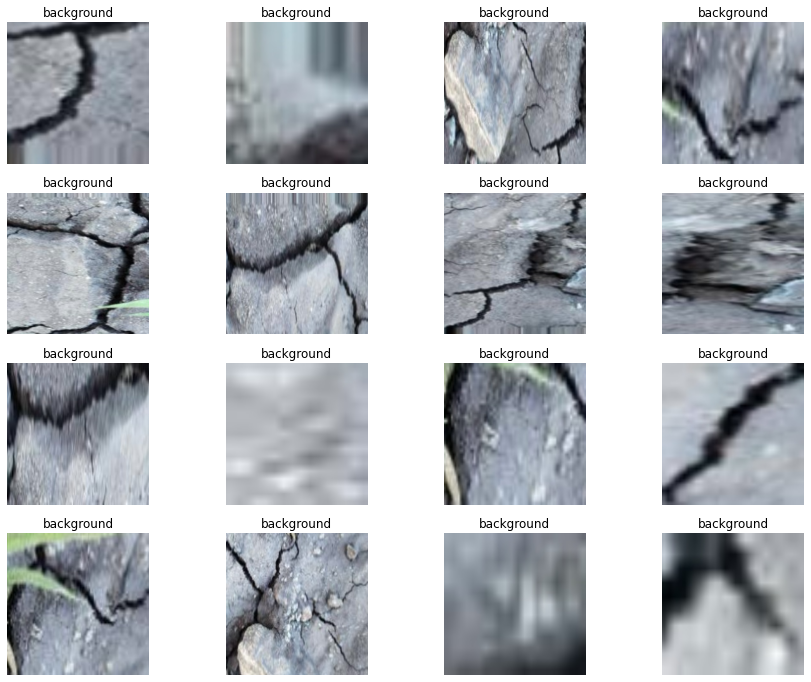

In [ ]:
plt.figure(figsize=(15,12))
for i,img in enumerate(os.listdir('Train/background')[:16]):
    plt.subplot(4,4,i+1)
    plt.title('background')
    img = cv2.imread('Train/background/'+img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')

plt.show()  

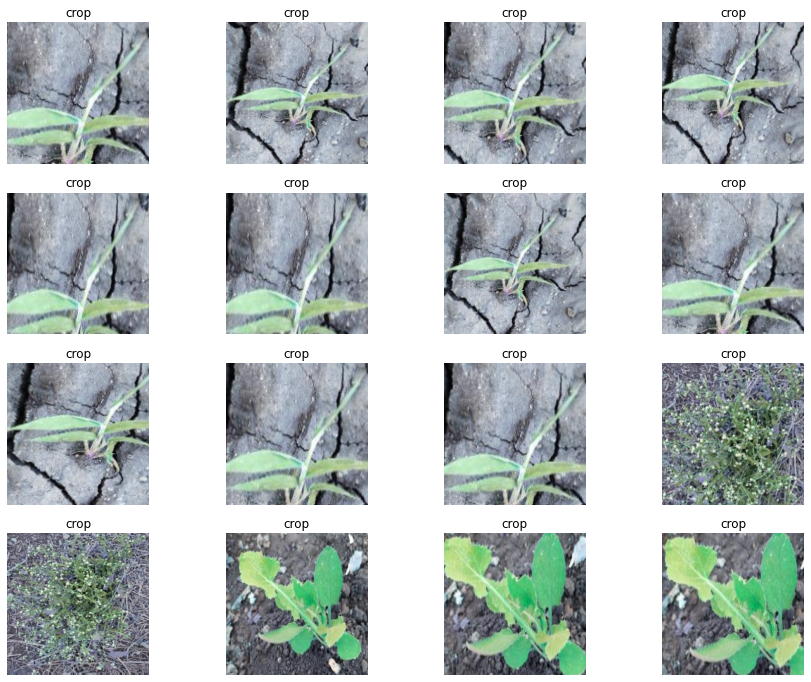

In [ ]:
plt.figure(figsize=(15,12))
for i,img in enumerate(os.listdir('Train/crop')[0:16]):
    plt.subplot(4,4,i+1)
    plt.title('crop')
    img = cv2.imread('Train/crop/'+img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')

plt.show()

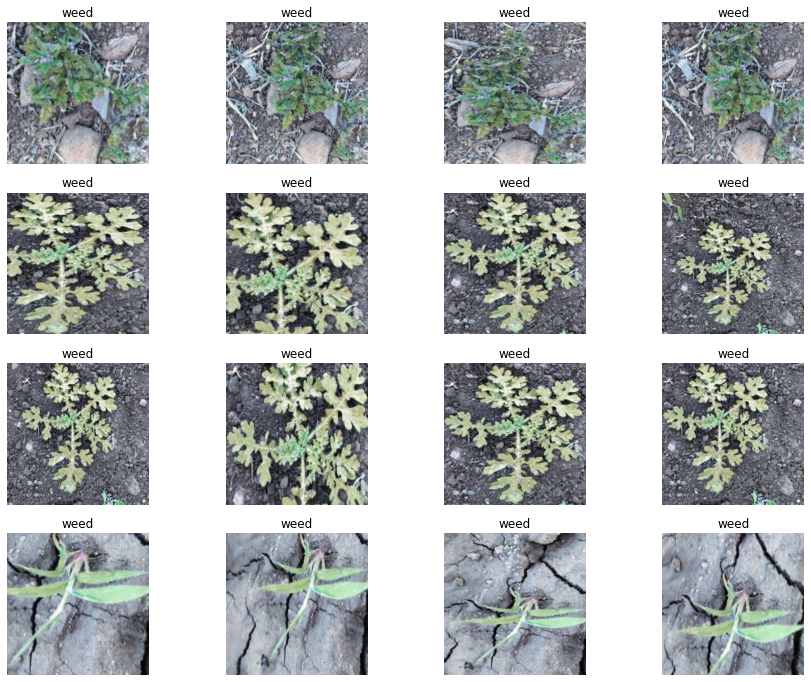

In [ ]:
plt.figure(figsize=(15,12))

for i,img in enumerate(os.listdir('Train/weed')[0:16]):
    plt.subplot(4,4,i+1)
    plt.title('weed')
    img = cv2.imread('Train/weed/'+img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
plt.show()    

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import os
from tqdm import tqdm
import json
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

In [ ]:
train_path = '/content/drive/MyDrive/rcnnn/Train'
test_path = '/content/drive/MyDrive/rcnnn/Test'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
BATCH_SIZE = 64
IMAGE_SIZE = (224,224,3)

In [ ]:
train_generator = ImageDataGenerator(rescale=1./255,validation_split=0.2)

train_data = train_generator.flow_from_directory(train_path,
                                                 target_size=(224, 224),
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=True,
                                                 subset='training')

val_data = train_generator.flow_from_directory(train_path,
                                                 target_size=(224, 224),
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=False,
                                                 subset='validation')

test_generator  = ImageDataGenerator(rescale=1./255)
test_data = test_generator.flow_from_directory(test_path,
                                                 target_size=(224, 224),
                                                 color_mode="rgb",
                                                 class_mode="categorical",shuffle=False,
                                                 batch_size=BATCH_SIZE)

Found 15176 images belonging to 3 classes.
Found 3793 images belonging to 3 classes.
Found 13507 images belonging to 3 classes.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.layers import Dense,Flatten,Input,Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
baseModel = VGG19(weights="imagenet", include_top=False,
    input_tensor=Input(shape=IMAGE_SIZE))

headModel = baseModel.output
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(4096, activation='relu')(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(4096, activation='relu')(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(3, activation='softmax')(headModel)

for layer in baseModel.layers:
    layer.trainable = False

model = Model(inputs=baseModel.input, outputs=headModel)

opt = Adam(lr=0.001)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

80142336/80134624 [==============================] - 0s 0us/step


In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [ ]:
#early_stop = EarlyStopping(patience=0,monitor='val_loss')

In [ ]:
results = model.fit_generator(train_data,epochs=10,
                              validation_data=val_data)

Epoch 1/10
  2/238 [..............................] - ETA: 59:01 - loss: 15.8488 - accuracy: 0.5469  

KeyboardInterrupt: ignored

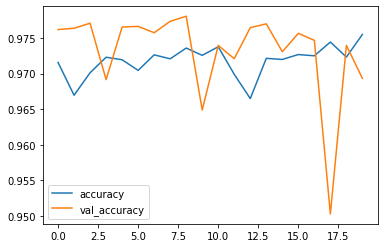

In [ ]:
pd.DataFrame(model.history.history)[['accuracy','val_accuracy']].plot()

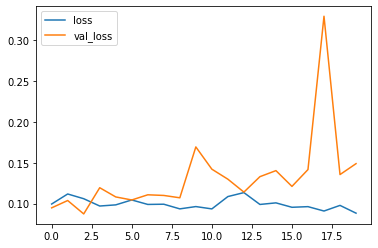

In [ ]:
pd.DataFrame(model.history.history)[['loss','val_loss']].plot()

In [ ]:
test_pred = model.predict_generator(test_data)

In [ ]:
pred_class = [np.argmax(x) for x in test_pred]

In [ ]:
test_data.class_indices

{'background': 0, 'crop': 1, 'weed': 2}

In [ ]:
true_class = test_data.classes

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
print(classification_report(true_class,pred_class))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      8948
           1       0.06      0.12      0.08       111
           2       0.96      0.86      0.91      4448

    accuracy                           0.94     13507
   macro avg       0.66      0.66      0.65     13507
weighted avg       0.95      0.94      0.94     13507



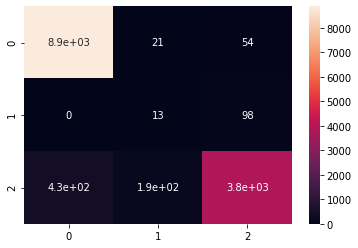

In [ ]:
sns.heatmap(confusion_matrix(true_class,pred_class),annot=True)

In [ ]:
mapping_class = test_data.class_indices

In [ ]:
mapping_class = dict([(value, key) for key, value in mapping_class.items()]) 

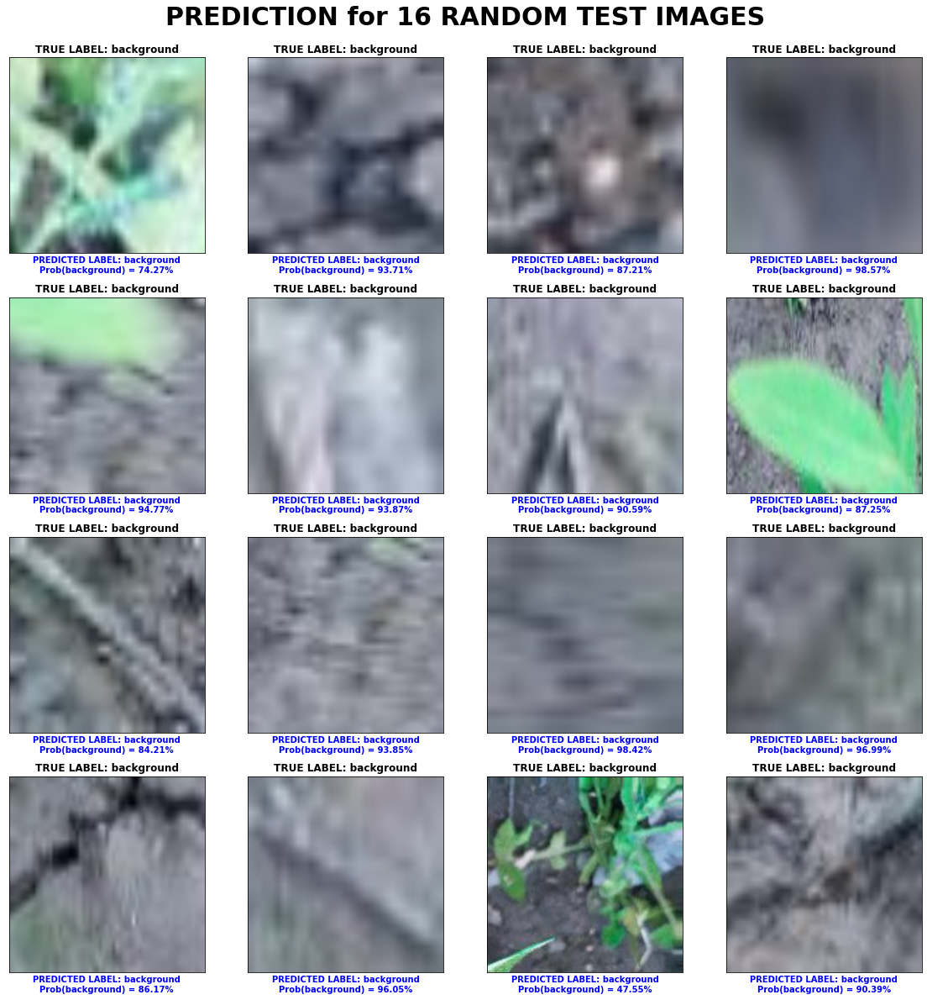

In [ ]:
images, labels = next(iter(test_data))
images = images.reshape(64, 224,224,3)
fig, axes = plt.subplots(4, 4, figsize=(16,16))

for ax, img, label in zip(axes.flat, images[:16], labels[:16]):
    ax.imshow(img)
    true_label = mapping_class[np.argmax(label)]
    
    pred_prob = model.predict(img.reshape(1, 224,224, 3))
    pred_label = mapping_class[np.argmax(pred_prob)]
    
    prob_class = np.max(pred_prob) * 100
    
    ax.set_title(f"TRUE LABEL: {true_label}", fontweight = "bold", fontsize = 12)
    ax.set_xlabel(f"PREDICTED LABEL: {pred_label}\nProb({pred_label}) = {(prob_class):.2f}%",
                 fontweight = "bold", fontsize = 10,
                 color = "blue" if true_label == pred_label else "red")
    
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
fig.suptitle("PREDICTION for 16 RANDOM TEST IMAGES", size = 30, y = 1.03, fontweight = "bold")
plt.show()

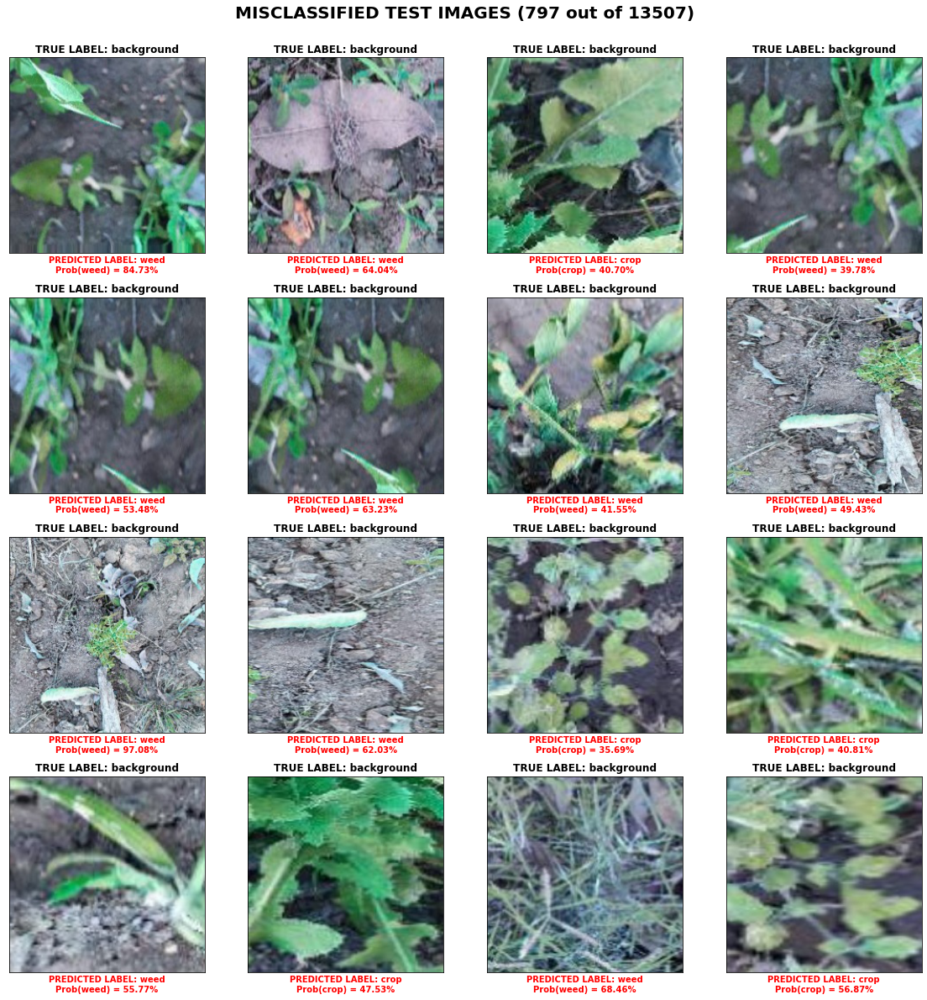

In [ ]:
misclassify_pred = np.nonzero(true_class != pred_class)[0]
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for ax, batch_num, image_num in zip(axes.flat, misclassify_pred // BATCH_SIZE, misclassify_pred % BATCH_SIZE):
    images, labels = test_data[batch_num]
    img = images[image_num]
    ax.imshow(img.reshape(*IMAGE_SIZE))
    
    true_label = mapping_class[np.argmax(label)]
    
    pred_prob = model.predict(img.reshape(1, 224,224, 3))
    pred_label = mapping_class[np.argmax(pred_prob)]
    
    prob_class = np.max(pred_prob)*100
    
    
    ax.set_title(f"TRUE LABEL: {true_label}", fontweight = "bold", fontsize = 12)
    ax.set_xlabel(f"PREDICTED LABEL: {pred_label}\nProb({pred_label}) = {(prob_class):.2f}%",
                 fontweight = "bold", fontsize = 10,
                 color = "blue" if true_label == pred_label else "red")
    
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
fig.suptitle(f"MISCLASSIFIED TEST IMAGES ({len(misclassify_pred)} out of {len(true_class)})",
             size = 20, y = 1.03, fontweight = "bold")
plt.show()

In [ ]:
model.save('RCNN_crop_weed_classification_model.h5')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import os
from tqdm import tqdm
import json
import warnings
import seaborn as sns
warnings.filterwarnings('ignore')

In [3]:
train_json = '/content/drive/MyDrive/rcnnn/train.json'
test_json = '/content/drive/MyDrive/rcnnn/test.json'
images_path = '/content/drive/MyDrive/rcnnn/agri_data/agri_data/'
model_path  = '/content/drive/MyDrive/rcnnn/RCNN_crop_weed_classification_model.h5'
label_csv = '/content/drive/MyDrive/rcnnn/pascal_voc_format.csv'
negative_ex_path = '/content/drive/MyDrive/rcnnn/Train/background/'

In [4]:
with open(train_json,'r') as train:
    train_region = json.load(train)

In [5]:
with open(test_json,'r') as test:
    test_region = json.load(test)

In [6]:
train_images_list = list(train_region.keys())
test_images_list = list(test_region.keys())

In [7]:
print(len(train_images_list))
print(len(test_images_list))

1000
300


In [8]:
labels = pd.read_csv(label_csv)
labels.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,agri_0_9354.jpeg,512,512,weed,63,120,425,442
1,agri_0_9354.jpeg,512,512,weed,0,1,180,148
2,agri_0_7574.jpeg,512,512,crop,95,167,453,469
3,agri_0_8960.jpeg,512,512,weed,52,76,422,353
4,agri_0_417.jpeg,512,512,weed,7,75,511,411


In [9]:
model = tf.keras.models.load_model(model_path)

In [10]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [11]:
model_without_last_2FC = tf.keras.models.Model(model.inputs,model.layers[-5].output)

In [12]:
model_without_last_2FC.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [13]:
train_features = []

test_features = []


for index in tqdm(range(len(labels))):
    id = labels.loc[index,'filename']
    img = cv2.imread(images_path + id)
    rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    xmin,ymin,xmax,ymax = int(labels.loc[index,'xmin']) ,int(labels.loc[index,'ymin']),int(labels.loc[index,'xmax']),int(labels.loc[index,'ymax'])

    resized = cv2.resize(rgb_img[ymin:ymax,xmin:xmax,:],(224,224))

    feature_of_img = model_without_last_2FC.predict(resized.reshape(1,224,224,3)/255)
    
    if id in train_images_list:
        
        train_features.append([feature_of_img,labels.loc[index,'class']])
        
    else:
        test_features.append([feature_of_img,labels.loc[index,'class']])

100%|██████████| 2072/2072 [10:39<00:00,  3.24it/s]


In [14]:
print(len(train_features))

print(len(test_features))

1711
361


In [16]:
for index,img in tqdm(enumerate(os.listdir(negative_ex_path)[:5000])):  #only extracting for 10,000 images
    img = cv2.imread(negative_ex_path + img )
    rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    #images already in (224,224,3)
    feature_of_img = model_without_last_2FC.predict(rgb.reshape(1,224,224,3)/255)
    if index<3500:
        train_features.append([feature_of_img,'background'])
    else:
        test_features.append([feature_of_img,'background'])

5000it [27:20,  3.05it/s]


In [17]:
import random
random.shuffle(train_features)

In [18]:
X_train = np.array([x[0] for x in train_features])
X_train = X_train.reshape(-1,4096)

In [19]:
X_train.shape

(5211, 4096)

In [20]:
y_train = [x[1] for x in train_features]
y_train = np.array(y_train).reshape(-1,1)

In [21]:
y_train.shape

(5211, 1)

In [22]:
X_test = np.array([x[0] for x in test_features])
X_test = X_test.reshape(-1,4096)

In [23]:
y_test = [x[1] for x in test_features]
y_test = np.array(y_test).reshape(-1,1)

In [24]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix

In [25]:
svm_model_linear = SVC(kernel = 'linear', C = 1,probability=True).fit(X_train, y_train) 
svm_predictions = svm_model_linear.predict(X_test)

In [26]:
accuracy = svm_model_linear.score(X_test, y_test)

In [27]:
accuracy

0.9645351961311123

In [28]:
cm = confusion_matrix(y_test, svm_predictions) 

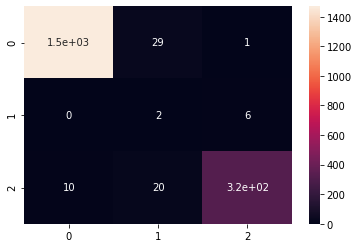

In [29]:
sns.heatmap(cm,annot=True)

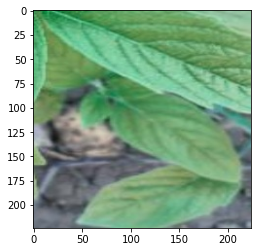

In [30]:
img = cv2.imread(negative_ex_path + os.listdir(negative_ex_path)[45] )
rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(rgb)

In [31]:
feature_of_img = model_without_last_2FC.predict(rgb.reshape(1,224,224,3)/255)

In [32]:
svm_model_linear.predict(feature_of_img)

array(['background'], dtype='<U10')

In [33]:
svm_model_linear.predict_proba(feature_of_img)

array([[0.75588593, 0.20886623, 0.03524784]])

In [34]:
svm_model_linear.classes_

array(['background', 'crop', 'weed'], dtype='<U10')

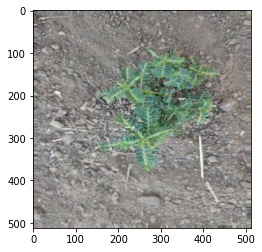

In [35]:
img = cv2.imread(images_path+'agri_0_1024.jpeg')
rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(rgb)

In [36]:
resized = cv2.resize(rgb,(224,224))

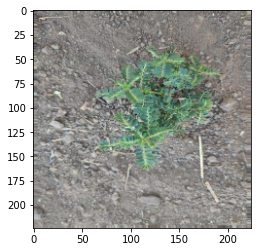

In [37]:
plt.imshow(resized)

In [38]:
svm_model_linear.predict_proba(model_without_last_2FC.predict(resized.reshape(1,224,224,3)/255))

array([[4.39090660e-06, 2.87422842e-03, 9.97121381e-01]])

In [39]:
import pickle

with open('svm_classifier.pkl','wb') as svm_model:
    pickle.dump(svm_model_linear , svm_model)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import os
from tqdm import tqdm
import json
import warnings
import pickle
warnings.filterwarnings('ignore')

In [3]:
!pip uninstall opencv-python -y

Found existing installation: opencv-python 4.1.2.30
Uninstalling opencv-python-4.1.2.30:
  Successfully uninstalled opencv-python-4.1.2.30


In [4]:
!pip install opencv-contrib-python==4.5.3.56
import cv2


     |████████████████████████████████| 56.1 MB 33 kB/s 
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


In [5]:
model_path = '/content/drive/MyDrive/rcnnn/RCNN_crop_weed_classification_model.h5'
test_img_path = '/content/drive/MyDrive/rcnnn/Test/'
images_path = '/content/drive/MyDrive/rcnnn/agri_data/agri_data/'
svm_model_path = '/content/drive/MyDrive/rcnnn/svm_classifier.pkl'
images_name = [x for x in os.listdir(images_path) if x.endswith('.jpeg')]

In [6]:
model = tf.keras.models.load_model(model_path)

In [7]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [8]:
model_without_last_two_fc = tf.keras.models.Model(model.inputs,model.layers[-5].output)

In [9]:
model_without_last_two_fc.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [10]:
with open(svm_model_path,'rb') as svm:
    svm_model = pickle.load(svm)

In [11]:
def iou_calc(bb1 , bb2):
  
    true_xmin, true_ymin, true_width, true_height  = bb1
    bb_xmin, bb_ymin,  bb_width, bb_height = bb2

    true_xmax = true_xmin + true_width
    true_ymax = true_ymin + true_height
    bb_xmax = bb_xmin + bb_width
    bb_ymax = bb_ymin + bb_height

    #calculating area
    true_area = true_width * true_height
    bb_area   = bb_width * bb_height 

    #calculating itersection cordinates
    inter_xmin = max(true_xmin , bb_xmin) 
    inter_ymin = max(true_ymin , bb_ymin)
    inter_xmax = min(true_xmax , bb_xmax)
    inter_ymax = min(true_ymax , bb_ymax)

    if inter_xmax <= inter_xmin or inter_ymax <= inter_ymin:
        iou = 0


    else:
        inter_area = (inter_xmax - inter_xmin) * (inter_ymax - inter_ymin)


        iou = inter_area / (true_area + bb_area - inter_area)
        
    assert iou<=1
    assert iou>=0
    
    return iou

In [12]:
def detection(img_path,confidence=0.9,iou_thresh=0.1):
    
    # appling selective search
    img = plt.imread(img_path)
    cv2.setUseOptimized(True);
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()
    rects = ss.process()
    sel_rects = rects[:2000]
    
    pred_crop=[]
    pred_weed=[]
    for index, rect in tqdm(enumerate(sel_rects)):

        x,y,w,h = rect
        roi = img[y:y+h,x:x+w,:]
        resized_roi = cv2.resize(roi,(224,224))/255
        
        # Feature extraction
        
        feature = model_without_last_two_fc.predict(resized_roi.reshape(-1,224,224,3))
        
        # SVM prediction
        pred = svm_model.predict_proba(feature.reshape(-1,4096))
        pred_lab=svm_model.predict(feature.reshape(-1,4096))

        if pred_lab == 'crop' and np.max(pred)>confidence:
            pred_crop.append([list(rect),np.max(pred)])
        elif pred_lab=='weed' and np.max(pred)>confidence:
            pred_weed.append([list(rect),np.max(pred)])
            
    final = []
    
    # Detection for crop class
    if len(pred_crop) != 0:
        pred_score_crop = [x[1] for x in pred_crop]
        pred_bb_crop = [x[0] for x in pred_crop]

        for i in range(len(pred_crop)):
            temp_bb , temp_score = pred_bb_crop.copy() , pred_score_crop.copy()
            if len(temp_bb) !=0:

                max_score_box = temp_bb[np.argmax(temp_score)]

                if [max_score_box,np.max(temp_score)] not in final:
                    final.append([max_score_box,np.max(temp_score),'crop'])
                    index_should_del = []

                    for ind,other_bb in enumerate(temp_bb):
                        iou_score = iou_calc(max_score_box , other_bb)
                        
                        # Non maximum suppression(nms)
                        
                        if iou_score >= iou_thresh:
                            index_should_del.append(ind)

                    pred_bb_crop    = []
                    pred_score_crop = []
                    for bb_index ,bb_value in enumerate(temp_bb) :
                        if bb_index not in index_should_del:
                            pred_bb_crop.append(bb_value)

                    for score_index ,score_value in enumerate(temp_score) :
                        if score_index not in index_should_del:
                            pred_score_crop.append(score_value)
                else:
                    continue

            else:
                break

    # Detection for weed class

    if len(pred_weed) != 0:
        pred_score_weed = [x[1] for x in pred_weed]
        pred_bb_weed = [x[0] for x in pred_weed]

        for i in range(len(pred_weed)):
            temp_bb , temp_score = pred_bb_weed.copy() , pred_score_weed.copy()
            if len(temp_bb) !=0:

                max_score_box = temp_bb[np.argmax(temp_score)]

                if [max_score_box,np.max(temp_score)] not in final:
                    final.append([max_score_box,np.max(temp_score),'weed'])
                    index_should_del = []

                    for ind,other_bb in enumerate(temp_bb):
                        iou_score = iou_calc(max_score_box , other_bb)

                        if iou_score >= iou_thresh:
                            index_should_del.append(ind)

                    pred_bb_weed    = []
                    pred_score_weed = []
                    for bb_index ,bb_value in enumerate(temp_bb) :
                        if bb_index not in index_should_del:
                            pred_bb_weed.append(bb_value)

                    for score_index ,score_value in enumerate(temp_score) :
                        if score_index not in index_should_del:
                            pred_score_weed.append(score_value)
                else:
                    continue

            else:
                break
    
   
    imOut = img.copy()
    for rect,score,cls in final:
        
        x,y,w,h = rect
        if cls == 'weed':
            color =(255,0,0)
        if cls == 'crop':
            color = (0,255,0)

        cv2.rectangle(imOut,(x,y),(x+w,y+h),color,2)

        cv2.putText(imOut,cls+':'+str(round(score*100,2)),(x,y-8),cv2.FONT_HERSHEY_SIMPLEX,1, color, 2, cv2.LINE_AA)
    plt.imshow(imOut)
    cv2.imwrite('prediction.jpeg',imOut)
   

    return final

1691it [02:02, 13.76it/s]


[[[239, 392, 130, 68], 0.943738411056155, 'crop'],
 [[270, 448, 52, 64], 0.9375400753332862, 'crop'],
 [[377, 199, 82, 71], 0.9130585432338636, 'crop'],
 [[361, 448, 79, 54], 0.9036905325646827, 'crop'],
 [[270, 205, 239, 307], 0.9999999998337911, 'weed'],
 [[0, 0, 242, 512], 0.9944537958663132, 'weed']]

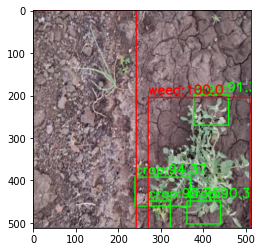

In [13]:
detection(images_path+images_name[1100])

1683it [01:32, 18.17it/s]


[[[228, 334, 81, 95], 0.9198936620177384, 'crop'],
 [[225, 0, 287, 412], 0.9999999999996619, 'weed'],
 [[0, 131, 294, 381], 0.9999999984738003, 'weed'],
 [[217, 172, 90, 112], 0.9999999445160186, 'weed'],
 [[0, 0, 255, 165], 0.9999974269067934, 'weed'],
 [[242, 59, 85, 91], 0.9999963450978396, 'weed'],
 [[384, 350, 128, 162], 0.9982784128281516, 'weed'],
 [[330, 95, 72, 93], 0.9932985187650526, 'weed'],
 [[110, 270, 92, 93], 0.9931384104964743, 'weed'],
 [[187, 410, 106, 102], 0.9918758532129921, 'weed'],
 [[116, 143, 88, 122], 0.9901331668828782, 'weed'],
 [[89, 419, 99, 93], 0.9857950390698881, 'weed'],
 [[276, 402, 88, 110], 0.9824333272202251, 'weed'],
 [[426, 248, 86, 107], 0.9656244837115562, 'weed'],
 [[0, 208, 99, 103], 0.9635893229954895, 'weed']]

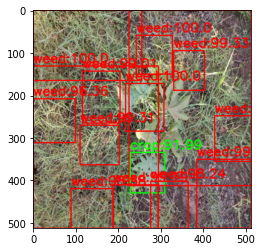

In [14]:
detection(images_path+images_name[100])

2000it [01:51, 17.88it/s]


[[[0, 69, 493, 341], 0.9995965184817213, 'crop'],
 [[328, 382, 184, 130], 0.9979005362455753, 'crop'],
 [[151, 400, 189, 66], 0.9631268323984743, 'crop']]

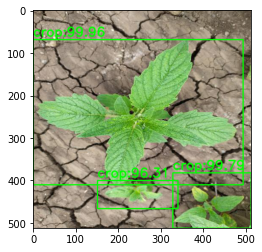

In [15]:
detection(images_path+images_name[700])

2000it [01:50, 18.04it/s]


[[[0, 0, 174, 117], 0.9976614564603674, 'crop'],
 [[0, 292, 418, 220], 0.99563739500167, 'crop'],
 [[294, 44, 117, 96], 0.9955583686404239, 'crop'],
 [[197, 166, 284, 156], 0.980258199629722, 'crop'],
 [[404, 0, 108, 78], 0.9792908921299835, 'crop'],
 [[5, 143, 256, 132], 0.9704675489725455, 'crop'],
 [[128, 0, 136, 40], 0.9514809104338708, 'crop'],
 [[302, 0, 81, 46], 0.9282324984558263, 'crop'],
 [[272, 151, 53, 32], 0.9103865273029691, 'crop'],
 [[323, 422, 55, 30], 0.9052788142641748, 'crop']]

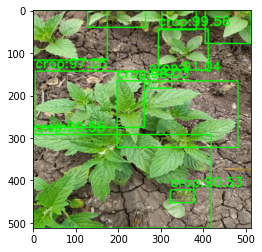

In [16]:
detection(images_path+images_name[506])

1724it [01:35, 17.96it/s]


[[[232, 274, 260, 238], 0.9960221553521755, 'crop'],
 [[160, 0, 330, 238], 0.9931585096107027, 'crop'],
 [[0, 148, 264, 364], 0.9910711545743074, 'crop']]

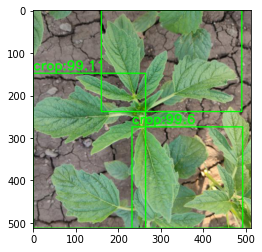

In [17]:
detection(images_path+images_name[983])